# Declare libraries

In [4]:
import torch
import copy
import os
import numpy as np
import random
import sys
import matplotlib.pyplot as plt
from tqdm import tqdm
from constants import *
PROJECT_ROOT = os.path.expanduser("~/Animal-Images-Denoising-with-Unet")
MODEL_ROOT = os.path.expanduser("~/Animal-Images-Denoising-with-Unet/model")
sys.path.append(PROJECT_ROOT)
sys.path.append(MODEL_ROOT)
from utils.prepare import download_dataset
from utils.processing import data_processing
from model.unet_model import UNet
from model.data_loader import get_dataloaders
from model.modelPipeline import train_model, plot_losses, evaluate, display_prediction

# Download and preprocess the data

In [8]:
download_dataset()
data_processing()

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/animal-faces
License(s): Attribution-NonCommercial 4.0 International (CC BY-NC 4.0)


100%|██████████| 696M/696M [00:28<00:00, 25.5MB/s] 



Dataset downloaded to: /home/letruongzzio/Animal-Images-Denoising-with-Unet/data/
Processing train dataset...
Processing validation dataset...
Selecting a random image for the test dataset...
Moved 50 random images to the test directory.
All datasets processed successfully!


# Prepare data and train the model

Loading the data...
Training the model...


/tmp/ipykernel_4239/1396125026.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  train_loader = torch.load(os.path.join(MODEL_DIRNAME, "storage/train_loader.pth"))
/tmp/i

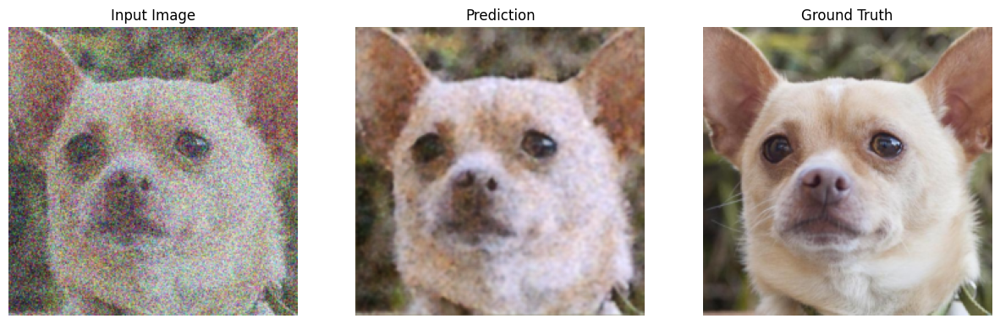

	RESULT: Train Loss: 0.0977, Val Loss: 0.0504


Epoch 2/10: 100%|██████████| 92/92 [01:05<00:00,  1.40it/s]


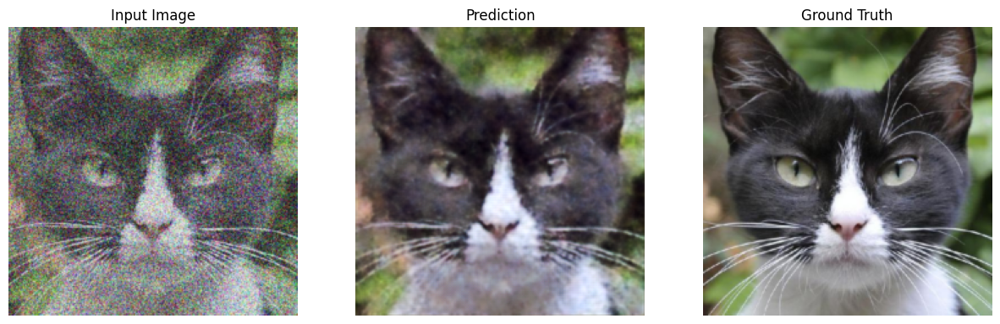

	RESULT: Train Loss: 0.0643, Val Loss: 0.0486


Epoch 3/10: 100%|██████████| 92/92 [01:06<00:00,  1.39it/s]


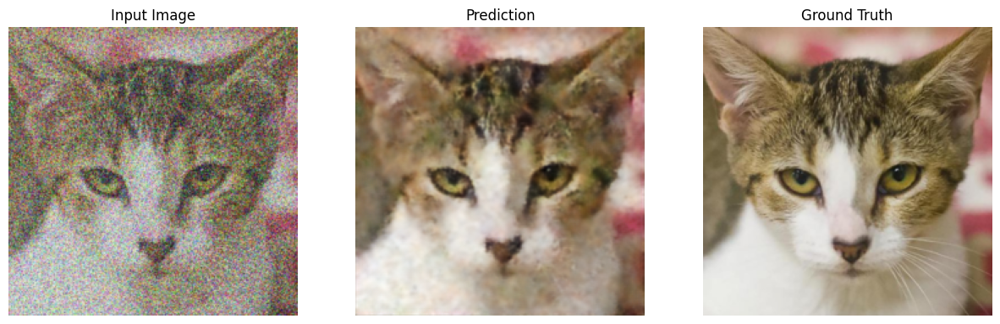

	RESULT: Train Loss: 0.0618, Val Loss: 0.0402


Epoch 4/10: 100%|██████████| 92/92 [01:05<00:00,  1.40it/s]


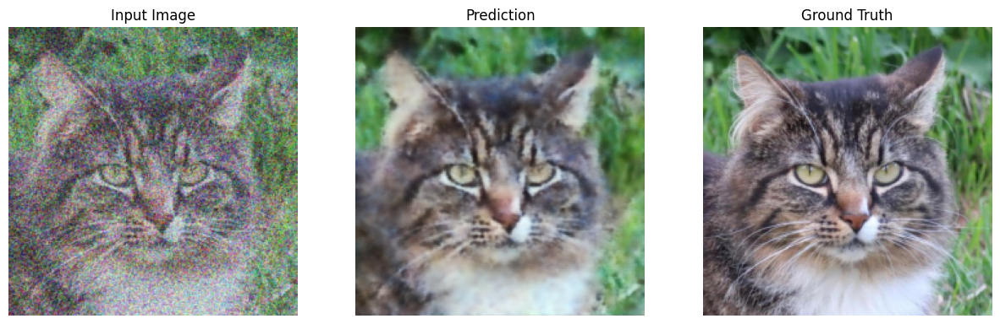

	RESULT: Train Loss: 0.0619, Val Loss: 0.0406


Epoch 5/10: 100%|██████████| 92/92 [01:05<00:00,  1.41it/s]


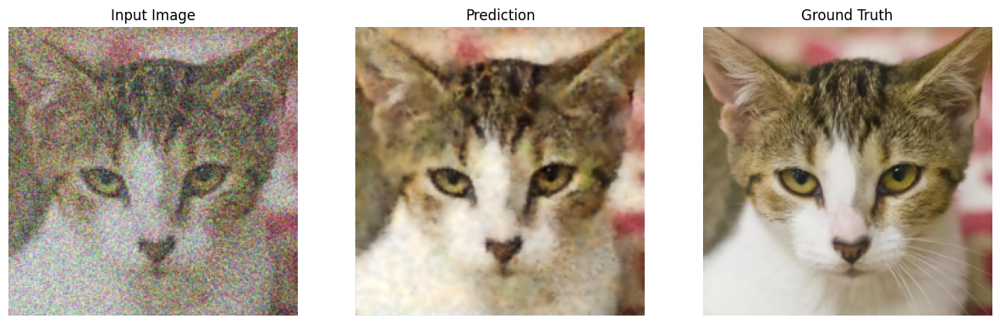

	RESULT: Train Loss: 0.0597, Val Loss: 0.0507


Epoch 6/10: 100%|██████████| 92/92 [01:05<00:00,  1.40it/s]


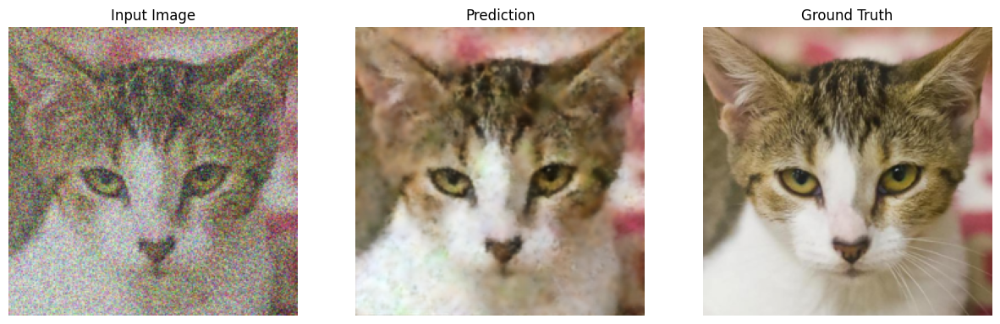

	RESULT: Train Loss: 0.0575, Val Loss: 0.0387


Epoch 7/10: 100%|██████████| 92/92 [01:06<00:00,  1.38it/s]


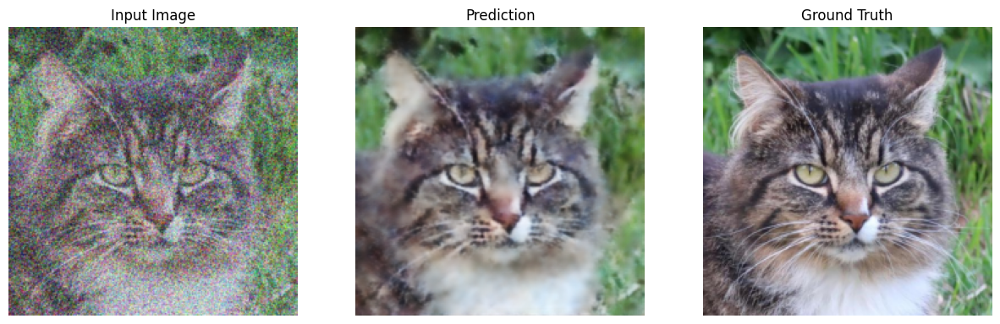

	RESULT: Train Loss: 0.0586, Val Loss: 0.0393


Epoch 8/10: 100%|██████████| 92/92 [01:06<00:00,  1.39it/s]


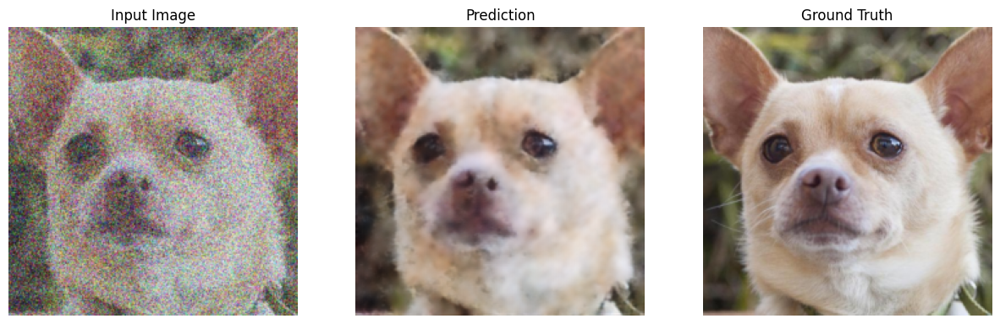

	RESULT: Train Loss: 0.0575, Val Loss: 0.0381


Epoch 9/10: 100%|██████████| 92/92 [01:05<00:00,  1.40it/s]


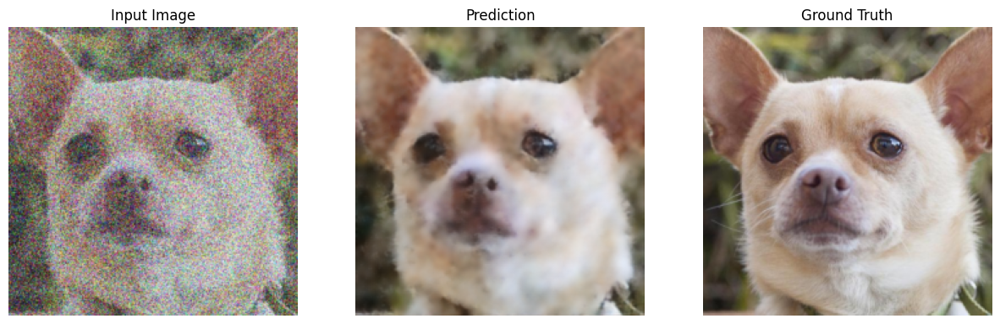

	RESULT: Train Loss: 0.0586, Val Loss: 0.0360


Epoch 10/10: 100%|██████████| 92/92 [01:05<00:00,  1.40it/s]


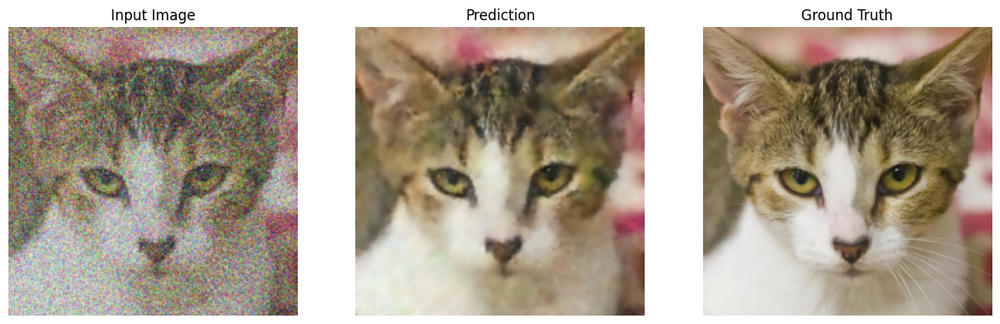

	RESULT: Train Loss: 0.0555, Val Loss: 0.0402
Plotting the training and validation losses...


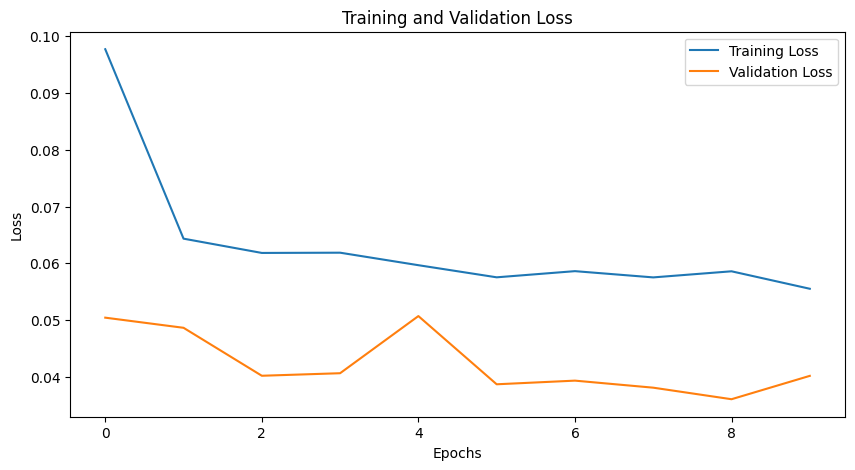

In [3]:
# Define the model parameters
max_epochs = 10
learning_rate = 0.001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model
model = UNet(in_channels=3, out_channels=3)
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Load the data
print("Loading the data...")
get_dataloaders(batch_size=[2, 4, 16])
train_loader = torch.load(os.path.join(MODEL_DIRNAME, "storage/train_loader.pth"))
val_loader = torch.load(os.path.join(MODEL_DIRNAME, "storage/val_loader.pth"))

# Train the model
print("Training the model...")
train_losses, val_losses, model = train_model(model, train_loader, val_loader, criterion, optimizer, max_epochs, device)

# Plot the losses
print("Plotting the training and validation losses...")
plot_losses(train_losses, val_losses)

# Free up memory
torch.cuda.empty_cache()

# Model Testing

/tmp/ipykernel_4239/1787758542.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  test_loader = torch.load(os.path.join(MODEL_DIRNAME, "storage/test_loader.pth"))


Test Loss: 0.0330


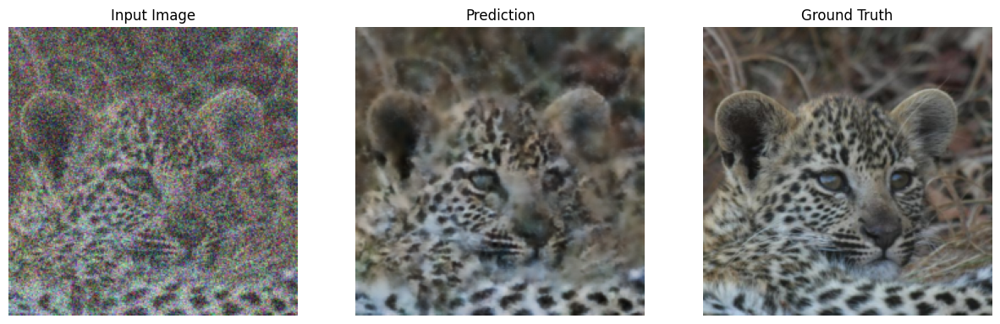

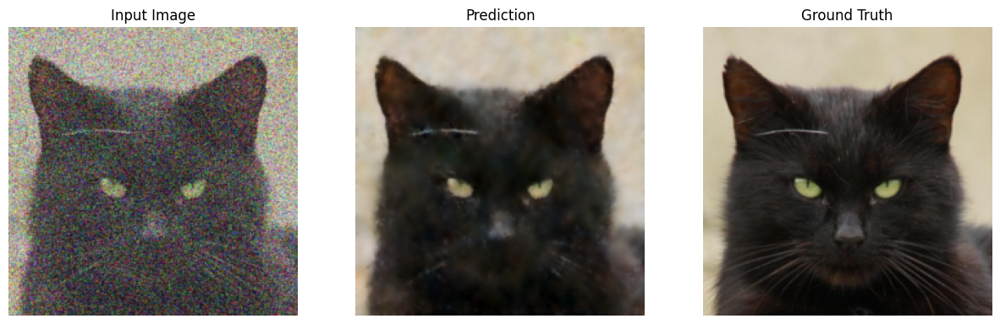

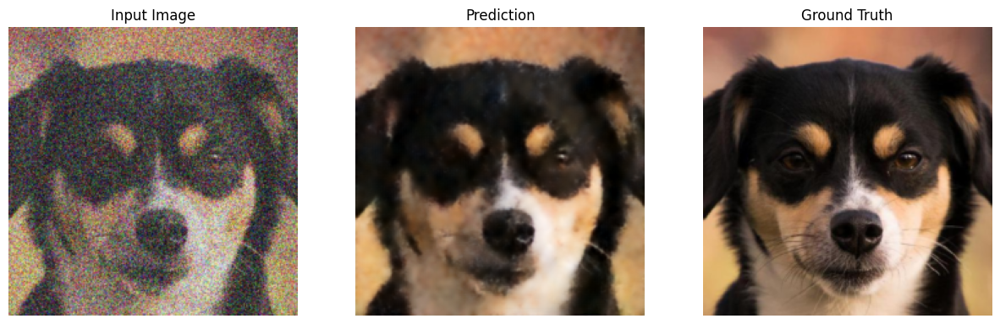

In [6]:
model.load_state_dict(torch.load(os.path.join(MODEL_DIRNAME, "storage/trained_unet.pth"), weights_only=True))

# Load the test loader
test_loader = torch.load(os.path.join(MODEL_DIRNAME, "storage/test_loader.pth"))

# Evaluate the model
test_loss = evaluate(model, test_loader, criterion, device, val_display=False)
print(f"Test Loss: {test_loss:.4f}")

# Display test predictions
storage_images = set()
for i in range(3):
    input_img, target_img = test_loader.dataset[i]
    if input_img in storage_images:
        continue
    storage_images.add(input_img)
    display_prediction(
        model=model,
        image=input_img.unsqueeze(0).to(device),
        target=target_img.unsqueeze(0).to(device),
        device=device,
        title="test_prediction"
   )